In [1]:
!pip install kaggle

In [2]:
!pip install kaggle
!pip install git+https://github.com/lucasb-eyer/pydensecrf.git

!pip install pydensecrf

  Cloning https://github.com/lucasb-eyer/pydensecrf.git to /tmp/pip-req-build-_gcq0t2k
  Running command git clone --filter=blob:none --quiet https://github.com/lucasb-eyer/pydensecrf.git /tmp/pip-req-build-_gcq0t2k
  Resolved https://github.com/lucasb-eyer/pydensecrf.git to commit dd070546eda51e21ab772ee6f14807c7f5b1548b
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pydensecrf: filename=pydensecrf-1.0-cp310-cp310-linux_x86_64.whl size=3405486 sha256=fea9abdbacb2c4f5afbd3debf8d6e9df61cbc03ed045508d1e6d661ff487fada
  Stored in directory: /tmp/pip-ephem-wheel-cache-fwqs4p0_/wheels/01/5b/61/87443ed3bf03dd2940375cf2f8b6fba88efece935465e490b0
Successfully built pydensecrf


In [3]:
from google.colab import files
files.upload()

Saving kaggle (2).json to kaggle (2).json


{'kaggle (2).json': b'{"username":"mahajanbhushan","key":"88002547ce5a2790b7eda0352585b43c"}'}

In [4]:
!mkdir -p ~/.kaggle
!cp "kaggle (2).json" ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d balraj98/deepglobe-road-extraction-dataset
!unzip -q deepglobe-road-extraction-dataset.zip -d dataset-folder

100% 3.79G/3.79G [00:45<00:00, 113MB/s]
100% 3.79G/3.79G [00:45<00:00, 90.1MB/s]


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##Segmentation of the images

In [ ]:
import cv2
import numpy as np
from PIL import Image
from glob import glob
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import ResNet50, VGG16
from tensorflow.keras.layers import Input, Concatenate, Conv2D, UpSampling2D
from tensorflow.keras.models import Model
from tensorflow.keras.metrics import MeanIoU
def segment_image(sat_image, mask_image):
   # Convert the mask to a binary format with a set threshold.
    _, binary_mask = cv2.threshold(mask_image, 128, 255, cv2.THRESH_BINARY)
    # Apply the mask to the satellite image to segment the road.
    road_segmented = cv2.bitwise_and(sat_image, sat_image, mask=binary_mask)
    return road_segmented
def load_and_segment_images(image_files, mask_files, target_size=(224, 224)):
    segmented_images = []
    masks = []
    for img_file, mask_file in zip(image_files, mask_files):
        sat_image = cv2.imread(img_file, cv2.IMREAD_COLOR)
        sat_image = cv2.resize(sat_image, target_size) # Resize the satellite image to the target size.
        mask_image = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE) # Read the mask image in grayscale.
        mask_image = cv2.resize(mask_image, target_size)
        segmented_img = segment_image(sat_image, mask_image) # Segment the satellite image using the mask.
        segmented_images.append(segmented_img)
        mask = Image.open(mask_file).resize(target_size)
        masks.append(np.array(mask))
    return segmented_images, masks

input_dir = "/content/dataset-folder/train"
sat_files = sorted(glob(os.path.join(input_dir, '*_sat.jpg')))
mask_files = sorted(glob(os.path.join(input_dir, '*_mask.png')))

segmented_images, masks = load_and_segment_images(sat_files, mask_files)

segmented_images = np.array(segmented_images).astype('float32') / 255.0
masks = np.array(masks).astype('float32') / 255.0
masks = np.expand_dims(masks, axis=-1)

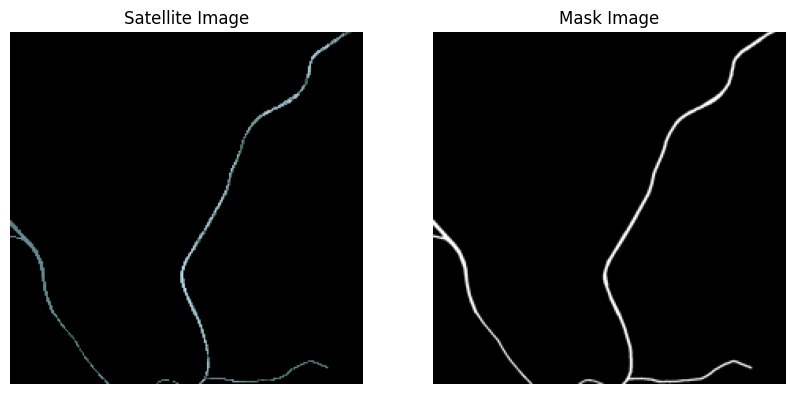

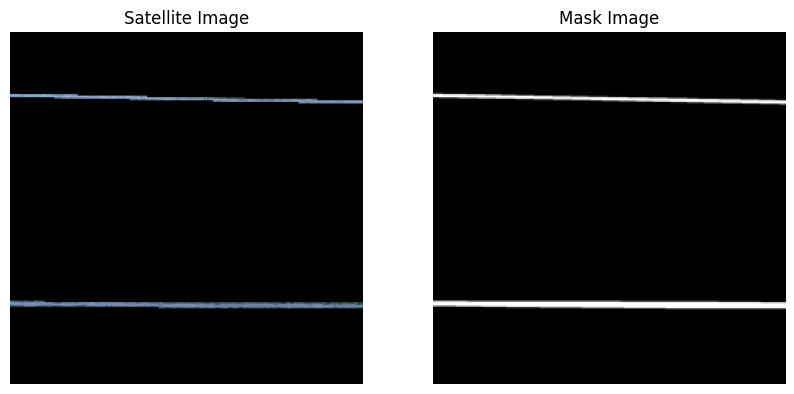

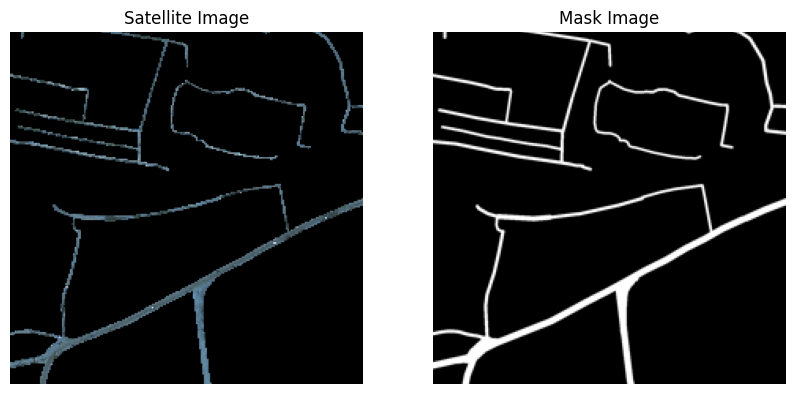

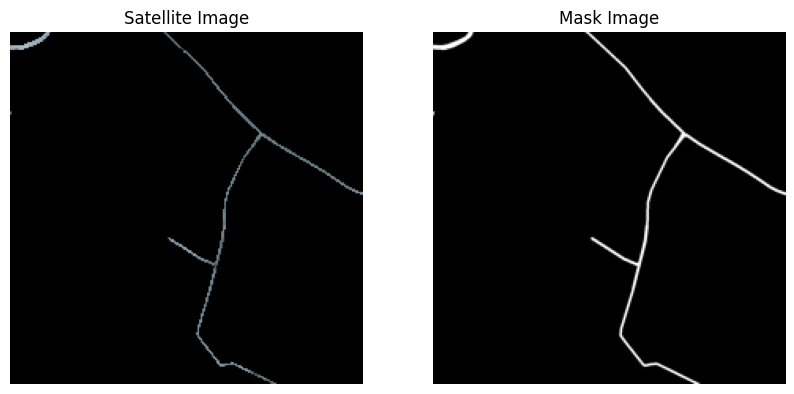

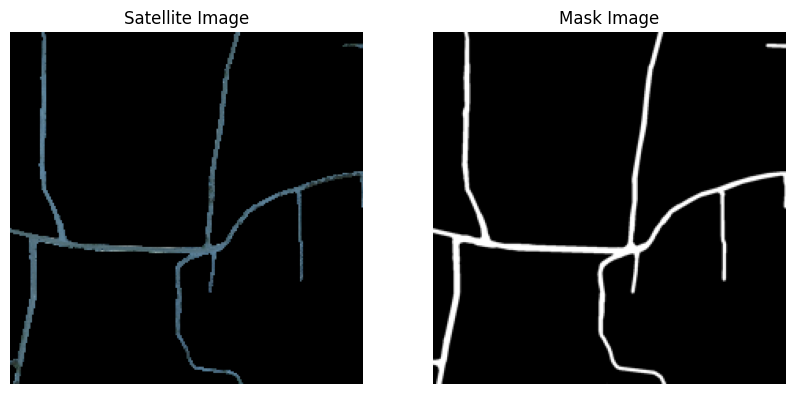

In [ ]:
import matplotlib.pyplot as plt
num_images_to_display = 5

for i in range(num_images_to_display):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(segmented_images[i])
    plt.title('Satellite Image')
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title('Mask Image')
    plt.axis('off')

    plt.show()

In [ ]:
import matplotlib.pyplot as plt
num_images = 5
for i in range(num_images):
      plt.subplot(2, num_images, i + 1)
      plt.imshow(segmented_images[i])
      plt.title("Image " + str(i))
      plt.axis('off')
      plt.subplot(2, num_images, num_images + i + 1)
      plt.imshow(masks[i, :, :, 0], cmap='gray')
      plt.title("Mask " + str(i))
      plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(segmented_images, masks, test_size=0.1, random_state=42)

In [ ]:
train_datagen = ImageDataGenerator()
valid_datagen = ImageDataGenerator()

train_generator = train_datagen.flow(X_train, y_train, batch_size=32)
valid_generator = valid_datagen.flow(X_valid, y_valid, batch_size=32)

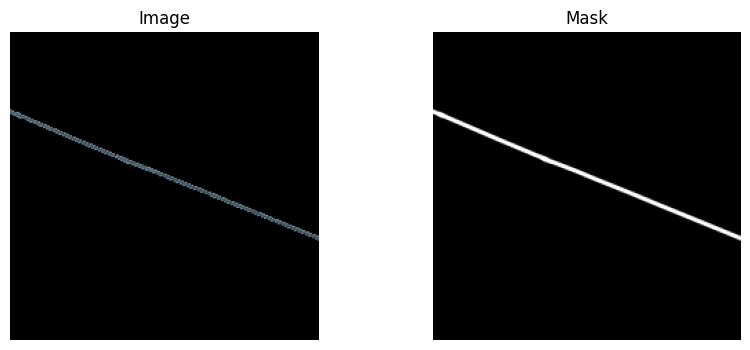

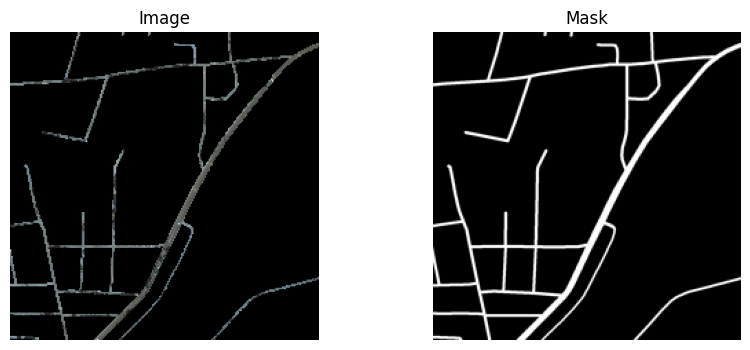

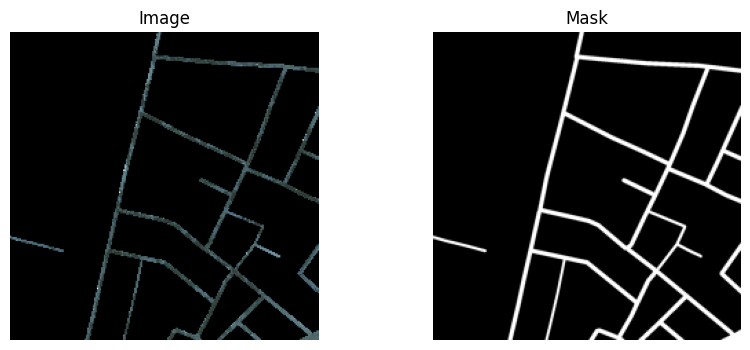

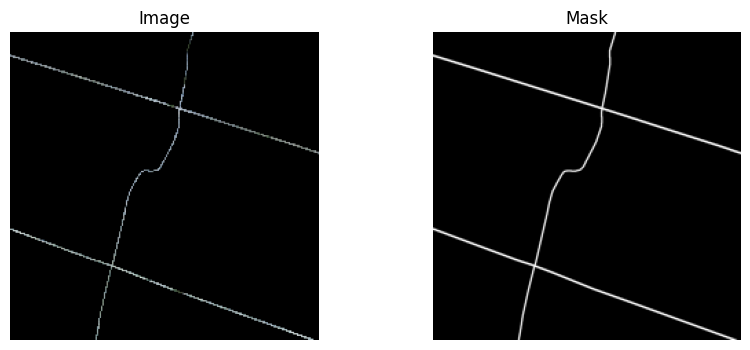

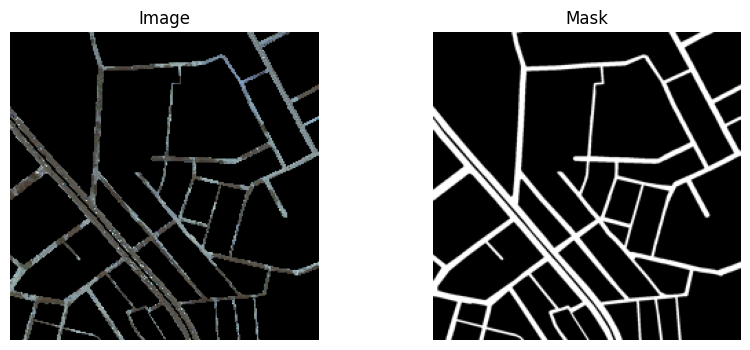

In [ ]:

import matplotlib.pyplot as plt
num_images_to_display = 5
images, masks = next(train_generator)
for i in range(num_images_to_display):
    plt.figure(figsize=(10, 4))

    # Display image
    plt.subplot(1, 2, 1)
    plt.imshow(images[i])
    plt.title('Image')
    plt.axis('off')

    # Display corresponding mask
    plt.subplot(1, 2, 2)
    plt.imshow(masks[i][:, :, 0], cmap='gray')
    plt.title('Mask')
    plt.axis('off')

    plt.show()

##Model Fusion

In [ ]:
import numpy as np
from keras.applications import ResNet50, VGG16
from keras.layers import Input, Concatenate, Conv2D, UpSampling2D, Conv2DTranspose
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
input_tensor = Input(shape=(224, 224, 3))
resnet_model = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)
vgg_model = VGG16(weights='imagenet', include_top=False, input_tensor=input_tensor)
resnet_features = resnet_model.output
vgg_features = vgg_model.output
merged_features = Concatenate()([resnet_features, vgg_features])
x = merged_features
x = Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
output = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same')(x)
output = Conv2D(1, (1, 1), activation='sigmoid', padding='same')(output)
fusion_model = Model(inputs=input_tensor, outputs=output)
fusion_model.compile(
    optimizer=Adam(),
    loss='binary_crossentropy',
    metrics=['accuracy']
)
fusion_model.summary()
history = fusion_model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // 32,
    validation_data=valid_generator,
    validation_steps=len(X_valid) // 32,
    epochs=20
)

58889256/58889256 [==============================] - 3s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                         

##Analysis of the Fusion Model

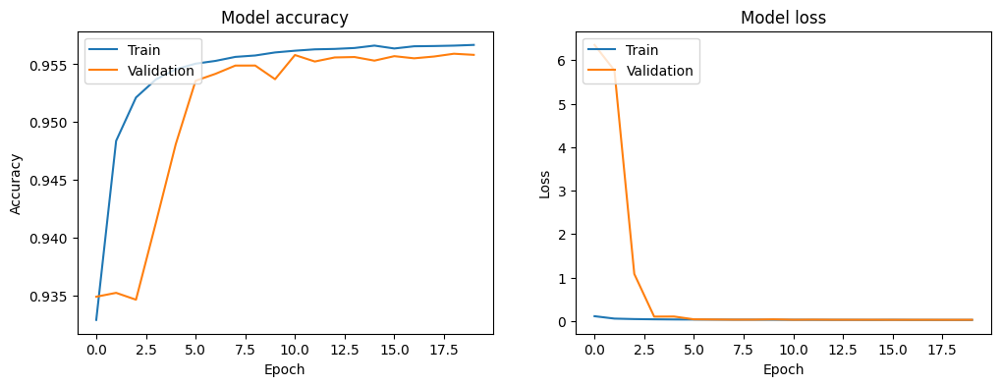

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [ ]:
import pickle

# save the iris classification model as a pickle file
fusion_model_segmentation_file = "/content/drive/MyDrive/Cv_Project/Model_fusion/fusion_model_segmentation_file.pkl"
with open(fusion_model_segmentation_file, 'wb') as file:
    pickle.dump(fusion_model, file)

In [ ]:
import pickle

# Save the history object to a file
with open('/content/drive/MyDrive/Cv_Project/Model_fusion/fusion_model_segmentation_history.pkl', 'wb') as file:
    pickle.dump(history.history, file)
print("Training history saved!")

Training history saved!


##Unet

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, concatenate, Conv2DTranspose
from tensorflow.keras.models import Model

def unet(input_size=(224, 224, 3)):
    inputs = Input(input_size)
    conv1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    conv1 = Dropout(0.1)(conv1)
    conv1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    conv2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool1)
    conv2 = Dropout(0.1)(conv2)
    conv2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    conv3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool2)
    conv3 = Dropout(0.2)(conv3)
    conv3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    conv4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool3)
    conv4 = Dropout(0.2)(conv4)
    conv4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    conv5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool4)
    conv5 = Dropout(0.3)(conv5)
    conv5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv5)
    # Decoder
    decoder6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv5)
    decoder6 = concatenate([decoder6, conv4])
    conv6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(decoder6)
    conv6 = Dropout(0.2)(conv6)
    conv6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv6)
    decoder7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    decoder7 = concatenate([decoder7, conv3])
    conv7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(decoder7)
    conv7 = Dropout(0.2)(conv7)
    conv7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv7)
    decoder8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    decoder8 = concatenate([decoder8, conv2])
    conv8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(decoder8)
    conv8 = Dropout(0.1)(conv8)
    conv8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv8)
    decoder9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    decoder9 = concatenate([decoder9, conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(decoder9)
    conv9 = Dropout(0.1)(conv9)
    conv9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv9)
    # Output layer
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(conv9)
    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model
unet_model = unet()
unet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_5 (Conv2D)           (None, 224, 224, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 224, 224, 64)         0         ['conv2d_5[0][0]']            
                                                                                                  
 conv2d_6 (Conv2D)           (None, 224, 224, 64)         36928     ['dropout[0][0]']             
                                                                                            

In [ ]:
# Fit the model
history1 = unet_model.fit(
    train_generator,
    validation_data=valid_generator,
    steps_per_epoch=len(X_train) // 32,
    validation_steps=len(X_valid) // 32,
    epochs=20
)

Epoch 1/20
175/175 [==============================] - 85s 423ms/step - loss: 0.0760 - accuracy: 0.9516 - val_loss: 0.0234 - val_accuracy: 0.9563
Epoch 2/20
175/175 [==============================] - 73s 417ms/step - loss: 0.0225 - accuracy: 0.9572 - val_loss: 0.0222 - val_accuracy: 0.9562
Epoch 3/20
175/175 [==============================] - 73s 418ms/step - loss: 0.0216 - accuracy: 0.9572 - val_loss: 0.0215 - val_accuracy: 0.9566
Epoch 4/20
175/175 [==============================] - 73s 418ms/step - loss: 0.0211 - accuracy: 0.9572 - val_loss: 0.0211 - val_accuracy: 0.9565
Epoch 5/20
175/175 [==============================] - 73s 418ms/step - loss: 0.0208 - accuracy: 0.9571 - val_loss: 0.0210 - val_accuracy: 0.9562
Epoch 6/20
175/175 [==============================] - 73s 418ms/step - loss: 0.0206 - accuracy: 0.9572 - val_loss: 0.0206 - val_accuracy: 0.9568
Epoch 7/20
175/175 [==============================] - 73s 419ms/step - loss: 0.0205 - accuracy: 0.9572 - val_loss: 0.0206 - val_ac

##Analysis of Unet Model

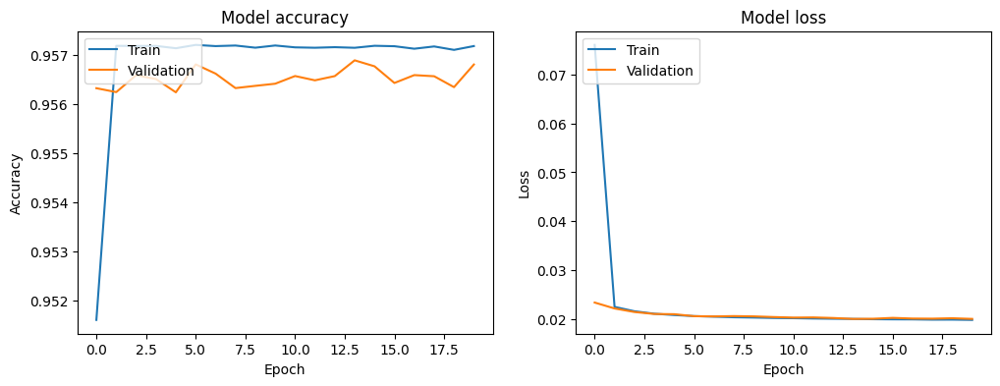

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'])
plt.plot(history1.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [ ]:
import pickle
unet_model_segmentation_file = "/content/drive/MyDrive/Cv_Project/U_net/unet_model_segmentation_file.pkl"
with open(unet_model_segmentation_file, 'wb') as file:
    pickle.dump(unet_model, file)

In [ ]:
import pickle
with open('/content/drive/MyDrive/Cv_Project/U_net/unet_model_segmentation_history.pkl', 'wb') as file:
    pickle.dump(history1.history, file)
print("Training history saved!")

Training history saved!


##Post Processing

##Predictions

35/35 [==============================] - 15s 327ms/step


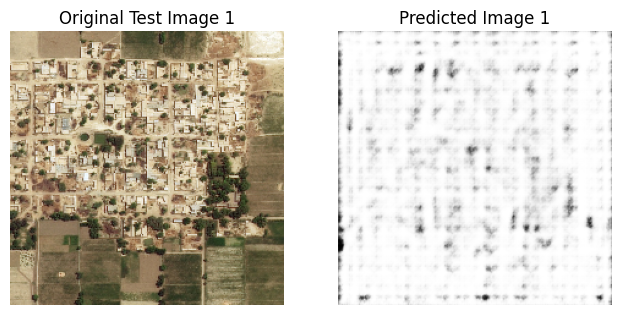

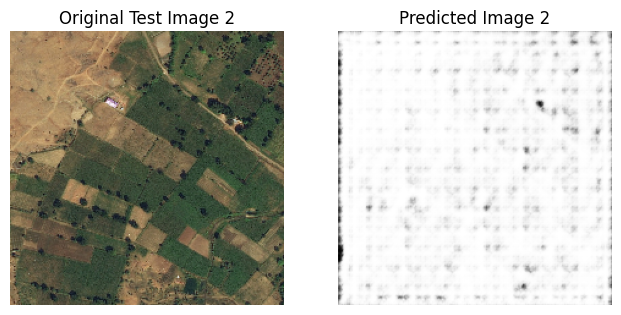

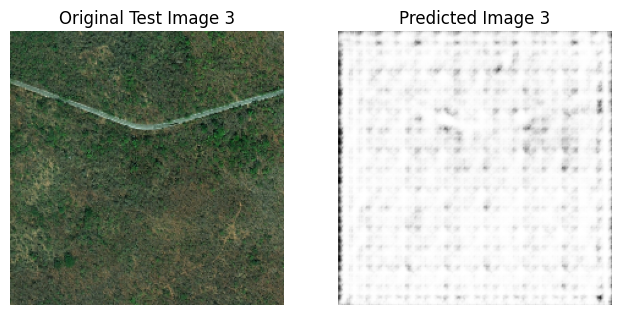

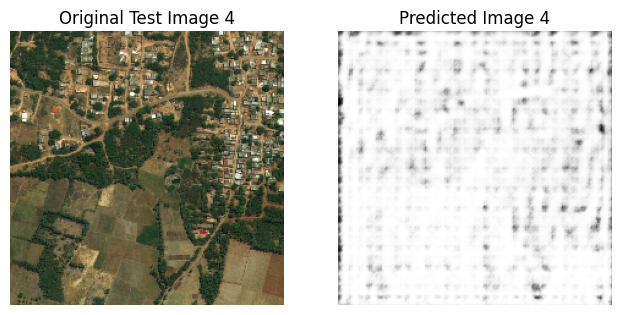

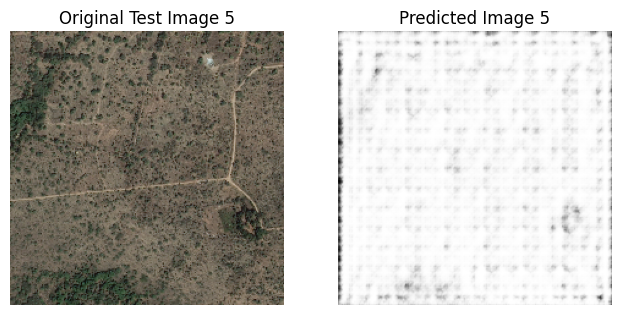

In [12]:
import os
import cv2
import numpy as np
import pickle
with open('/content/drive/MyDrive/Cv_Project/Model_fusion/fusion_model_segmentation_file.pkl', 'rb') as file:
   fusion_model = pickle.load(file)

test_folder = '/content/dataset-folder/test'

test_images = []
test_filenames = []
for filename in sorted(os.listdir(test_folder)):
    if filename.endswith('.jpg'):
        img_path = os.path.join(test_folder, filename)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224, 224))
        img = img / 255.0
        test_images.append(img)
        test_filenames.append(filename)
test_images_unet_aug = np.array(test_images)
threshold = 0.5
predictions_fusion = fusion_model.predict(test_images_unet_aug)
predictions_fusions = (predictions_fusion > threshold).astype(np.uint8)
num_images_to_show = 5
for i in range(min(num_images_to_show, len(predictions_fusion))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_aug[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(predictions_fusion[i], cmap='gray')
    plt.title(f'Predicted Image {i+1}')
    plt.axis('off')
    plt.show()


##Edge Detection

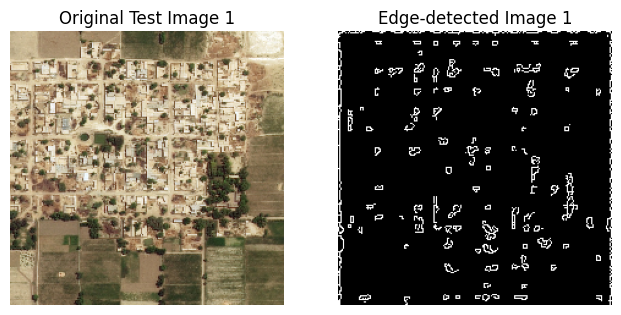

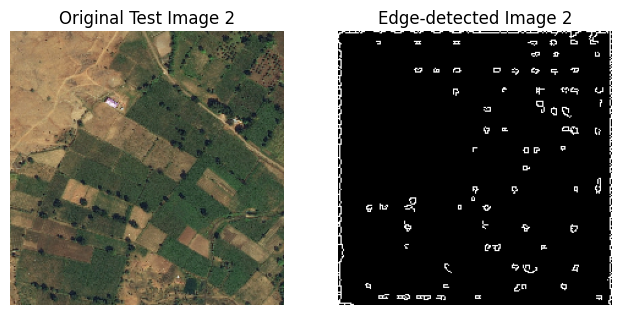

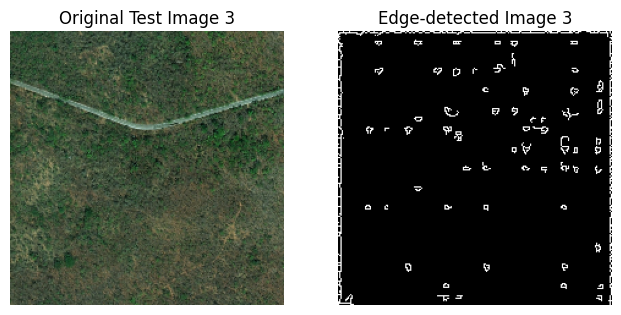

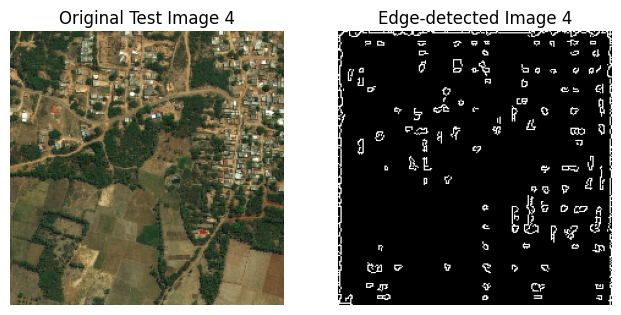

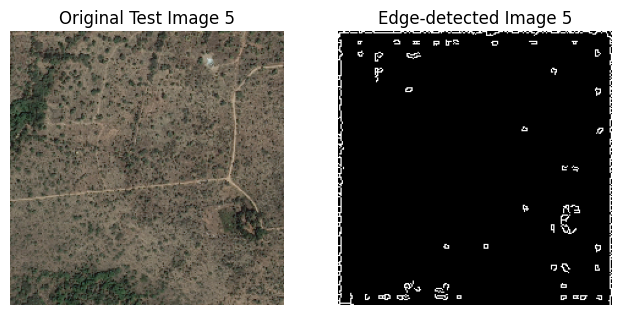

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
def apply_edge_detection(image):
    if image.ndim == 3 and image.shape[2] == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    if image.dtype != np.uint8:
        gray = (gray * 255).astype(np.uint8)
    edges = cv2.Canny(gray, 100, 200)
    return edges
edge_detected_predictions = np.array([apply_edge_detection(pred) for pred in predictions_fusion])
num_images_to_show = 5
for i in range(min(num_images_to_show, len(edge_detected_predictions))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_aug[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(edge_detected_predictions[i], cmap='gray')
    plt.title(f'Edge-detected Image {i+1}')
    plt.axis('off')
    plt.show()

##Morphological Operations

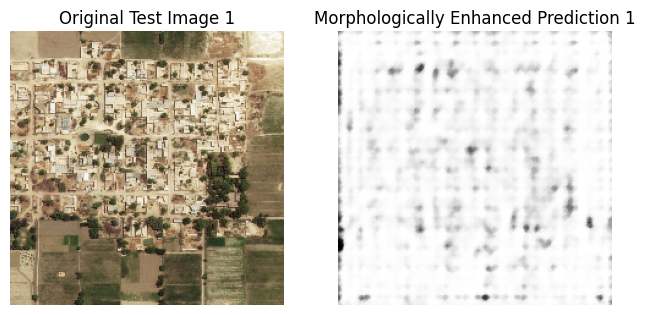

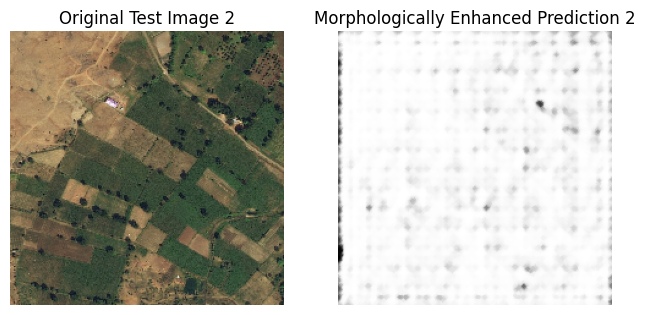

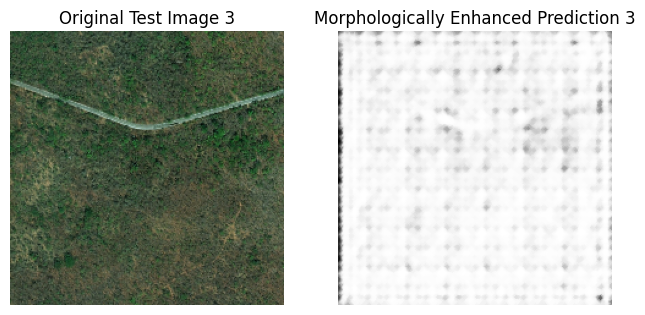

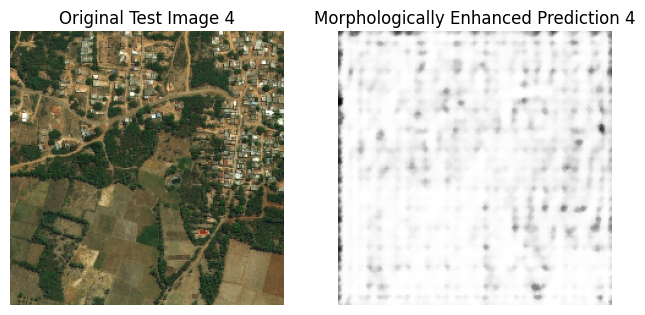

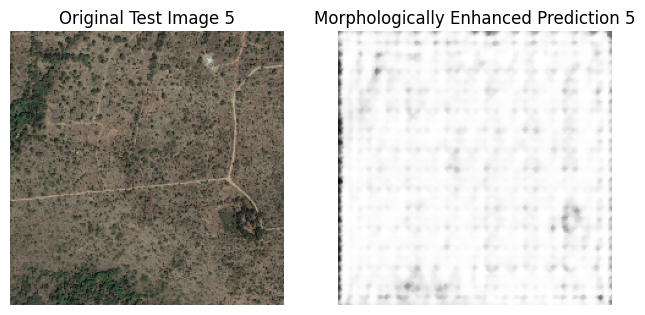

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_morphological_operations(prediction, kernel_size=3):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    opened = cv2.morphologyEx(prediction, cv2.MORPH_OPEN, kernel)
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)

    return closed
morphological_predictions = []
for pred in predictions_fusion:
  morph_pred = apply_morphological_operations(pred)
  morphological_predictions.append(morph_pred)
num_images_to_show = 5
for i, morph_pred in enumerate(morphological_predictions[:num_images_to_show]):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_aug[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(morph_pred, cmap='gray')
    plt.title(f'Morphologically Enhanced Prediction {i+1}')
    plt.axis('off')
    plt.show()

##Conditional Random Field

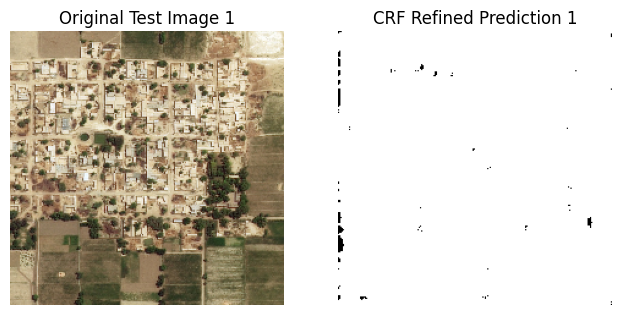

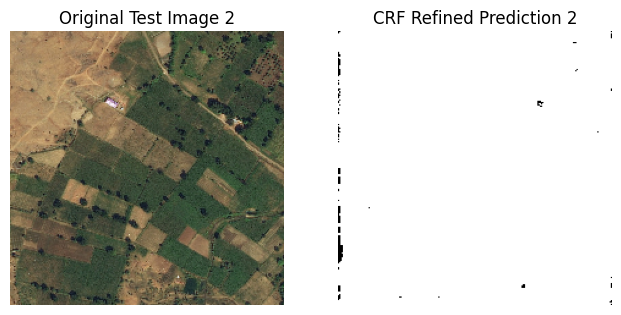

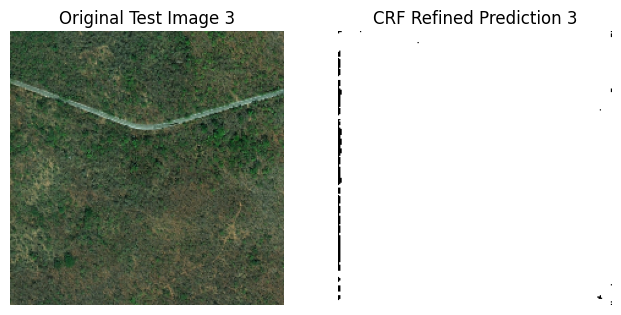

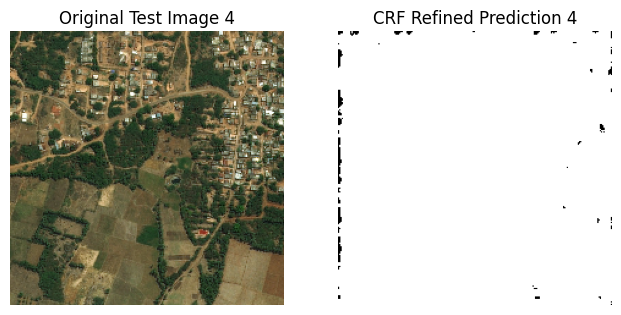

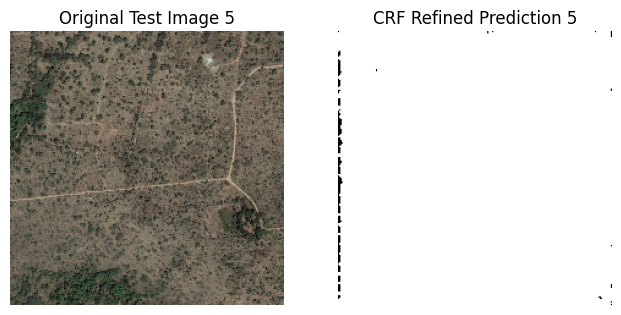

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_softmax

def apply_crf(image, prediction_prob, gdims=(3, 3), bdims=(80, 80), iter=5):
    prediction_prob = np.clip(prediction_prob, a_min=1e-7, a_max=1 - 1e-7)
    prediction_prob = 1 - prediction_prob
    unary_energy = np.stack((1 - prediction_prob, prediction_prob), axis=0)
    unary_energy = unary_energy.reshape((2, -1))
    unary = unary_from_softmax(-np.log(unary_energy))
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)
    d = dcrf.DenseCRF2D(image.shape[1], image.shape[0], 2)
    d.setUnaryEnergy(unary)
    d.addPairwiseGaussian(sxy=gdims, compat=3)
    d.addPairwiseBilateral(sxy=bdims, srgb=(13, 13, 13), rgbim=image, compat=10)
    Q = d.inference(iter)
    Q = np.array(Q).reshape((2, image.shape[0], image.shape[1]))

    return np.argmax(Q, axis=0)
crf_refined_predictions = []

for i in range(len(test_images)):
    original_image = test_images_unet_aug[i]
    prediction = predictions_fusions[i].squeeze()
    refined_prediction = apply_crf(original_image, prediction)
    crf_refined_predictions.append(refined_prediction)
num_images_to_show = 5
for i in range(min(num_images_to_show, len(crf_refined_predictions))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_aug[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(crf_refined_predictions[i], cmap='gray')
    plt.title(f'CRF Refined Prediction {i+1}')
    plt.axis('off')
    plt.show()

##U_Net Prediction

35/35 [==============================] - 13s 363ms/step


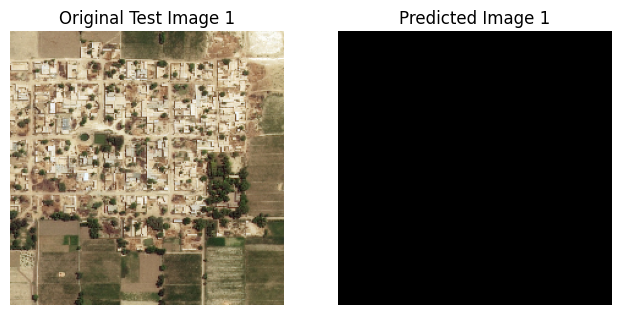

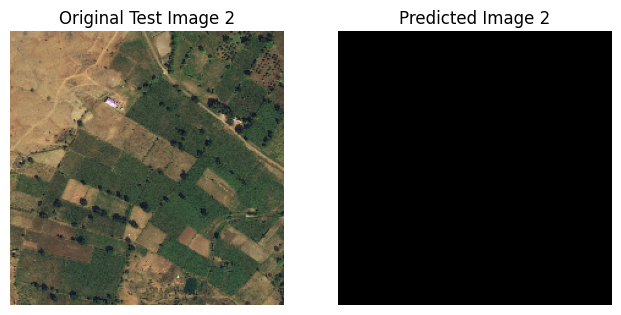

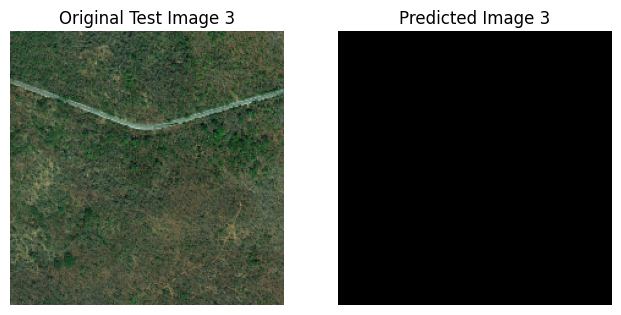

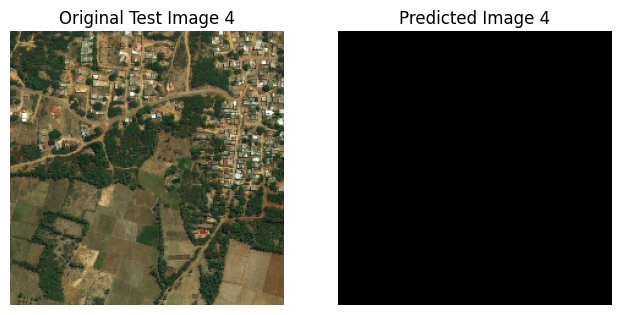

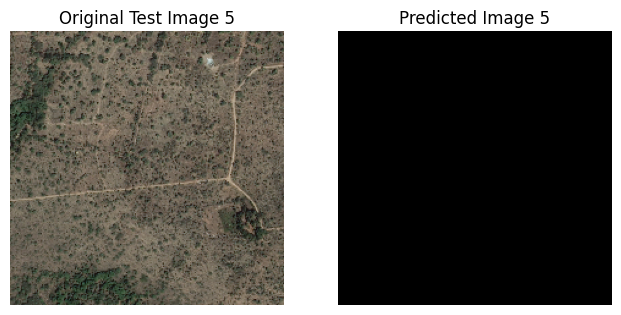

In [16]:
import os
import cv2
import numpy as np
import pickle
with open('/content/drive/MyDrive/Cv_Project/U_net/unet_model_segmentation_file.pkl', 'rb') as file:
    unet_model = pickle.load(file)

test_folder = '/content/dataset-folder/test'

test_images = []
test_filenames = []
for filename in sorted(os.listdir(test_folder)):
    if filename.endswith('.jpg'):
        img_path = os.path.join(test_folder, filename)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224, 224))
        img = img / 255.0
        test_images.append(img)
        test_filenames.append(filename)
test_images_unet_seg = np.array(test_images)
threshold = 0.1
predictions_ua = unet_model.predict(test_images_unet_seg)
predictions_unet_seg = (predictions_ua > threshold).astype(np.uint8)
num_images_to_show = 5
for i in range(min(num_images_to_show, len(predictions_ua))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_seg[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(predictions_unet_seg[i], cmap='gray')
    plt.title(f'Predicted Image {i+1}')
    plt.axis('off')
    plt.show()

##Edge Detection

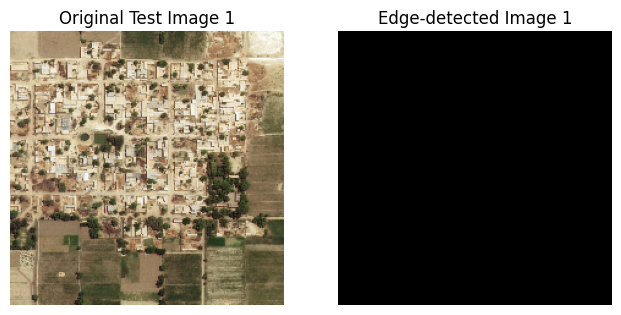

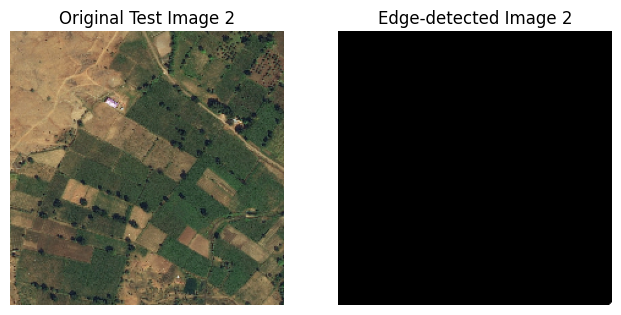

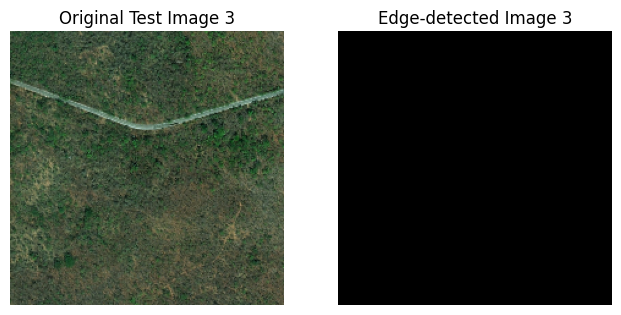

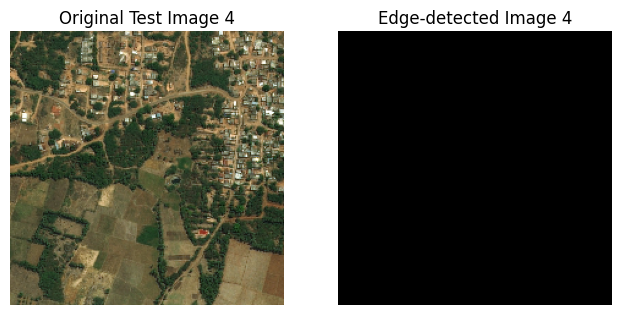

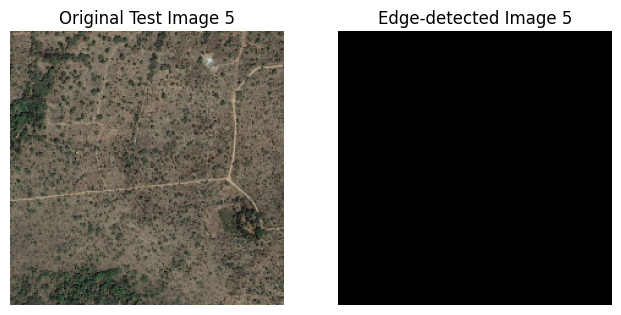

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
def apply_edge_detection(image):
    if image.ndim == 3 and image.shape[2] == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    if image.dtype != np.uint8:
        gray = (gray * 255).astype(np.uint8)
    edges = cv2.Canny(gray, 100, 200)
    return edges
edge_detected_predictions = np.array([apply_edge_detection(pred) for pred in predictions_ua])
num_images_to_show = 5
for i in range(min(num_images_to_show, len(edge_detected_predictions))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_seg[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(edge_detected_predictions[i], cmap='gray')
    plt.title(f'Edge-detected Image {i+1}')
    plt.axis('off')
    plt.show()

##Morphological Operations

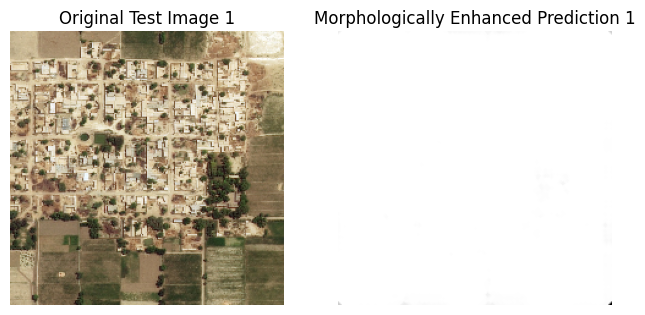

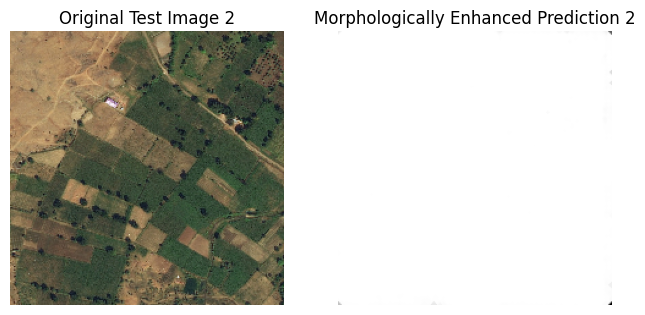

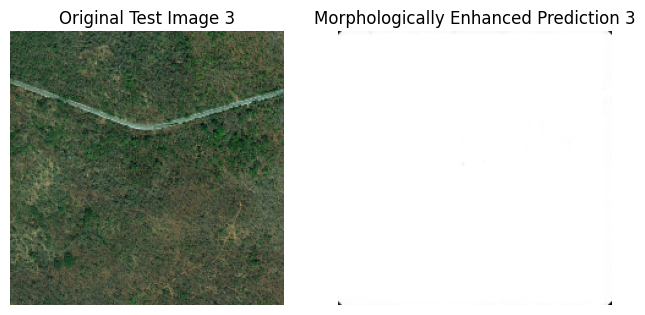

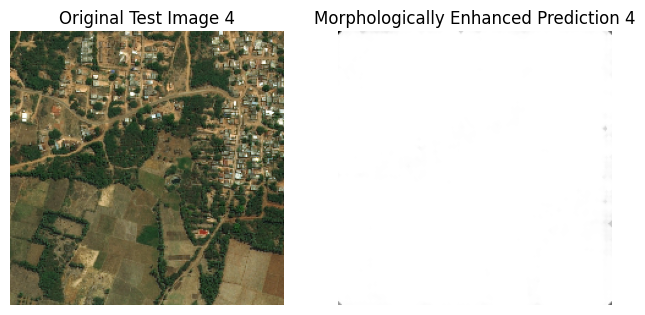

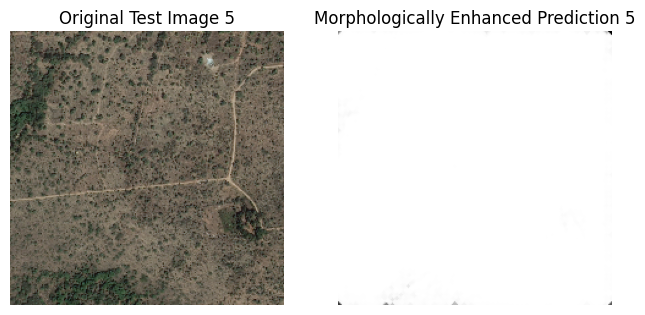

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_morphological_operations(prediction, kernel_size=3):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    opened = cv2.morphologyEx(prediction, cv2.MORPH_OPEN, kernel)
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)

    return closed
morphological_predictions = []
for pred in predictions_ua:
  morph_pred = apply_morphological_operations(pred)
  morphological_predictions.append(morph_pred)
num_images_to_show = 5
for i, morph_pred in enumerate(morphological_predictions[:num_images_to_show]):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_seg[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(morph_pred, cmap='gray')
    plt.title(f'Morphologically Enhanced Prediction {i+1}')
    plt.axis('off')
    plt.show()

##Conditional Random Field

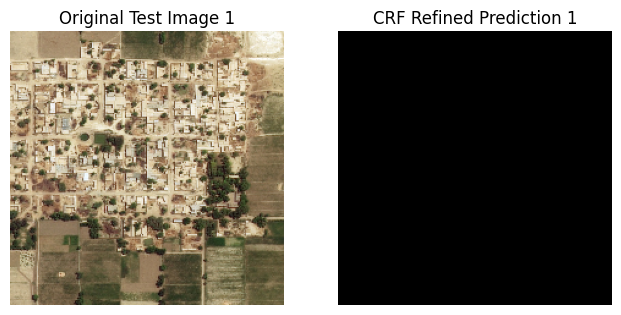

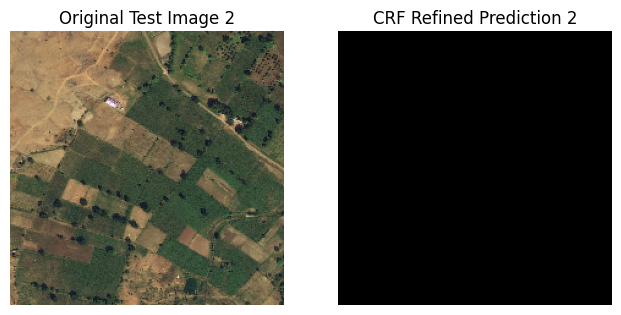

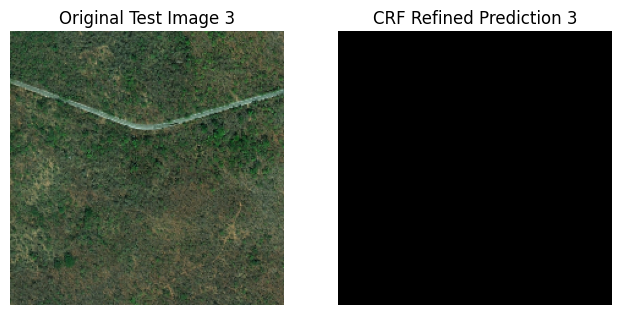

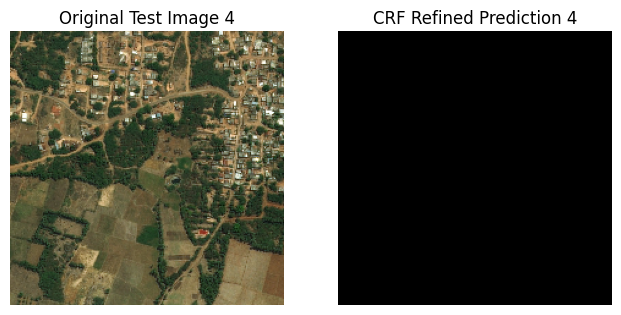

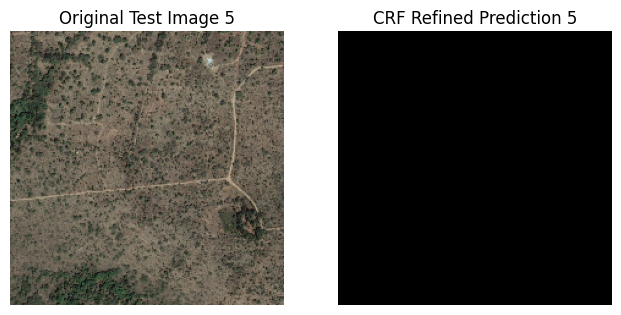

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_softmax

def apply_crf(image, prediction_prob, gdims=(3, 3), bdims=(80, 80), iter=5):
    prediction_prob = np.clip(prediction_prob, a_min=1e-7, a_max=1 - 1e-7)
    prediction_prob = 1 - prediction_prob
    unary_energy = np.stack((1 - prediction_prob, prediction_prob), axis=0)
    unary_energy = unary_energy.reshape((2, -1))
    unary = unary_from_softmax(-np.log(unary_energy))
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)
    d = dcrf.DenseCRF2D(image.shape[1], image.shape[0], 2)
    d.setUnaryEnergy(unary)
    d.addPairwiseGaussian(sxy=gdims, compat=3)
    d.addPairwiseBilateral(sxy=bdims, srgb=(13, 13, 13), rgbim=image, compat=10)
    Q = d.inference(iter)
    Q = np.array(Q).reshape((2, image.shape[0], image.shape[1]))

    return np.argmax(Q, axis=0)
crf_refined_predictions = []

for i in range(len(test_images)):
    original_image = test_images_unet_seg[i]
    prediction = predictions_unet_seg[i].squeeze()
    refined_prediction = apply_crf(original_image, prediction)
    crf_refined_predictions.append(refined_prediction)
num_images_to_show = 5
for i in range(min(num_images_to_show, len(crf_refined_predictions))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_seg[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(crf_refined_predictions[i], cmap='gray')
    plt.title(f'CRF Refined Prediction {i+1}')
    plt.axis('off')
    plt.show()